# Plotting in julia

In [1]:
using Pkg
package_dependencies = [
    :IJulia,
    :Distributions,
    :GR,
    :Plots,
    :PlotlyJS,
    :PyPlot,
    :SymPy];
@time for p in package_dependencies
    try
        @eval using $p
    catch
        try
            Pkg.add(p)
        catch
            print("Unable to install $p \n")
            continue
        end
    end
end
print("Finished Loading Dependencies")

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-3549134811626354956\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-9446534819117446731\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-3549134811626354956\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

 13.912771 seconds (20.60 M allocations: 1.301 GiB, 3.34% gc time)
Finished Loading Dependencies

When using `Plots.jl`, it is simply acting as a wrapper around a given
backend [^1] such as
*[PlotlyJS](https://github.com/JuliaPlots/PlotlyJS.jl)*,
*[PyPlot](https://github.com/JuliaPy/PyPlot.jl)*,
*[GR](https://github.com/jheinen/GR.jl)*, etc. [^2]


One of the advantages is that it offers a nice syntax for layouts which is well documented [^3]

[^1]: Tutorial · Plots. (2021, June 05). Retrieved from
    <https://docs.juliaplots.org/latest/tutorial/#plotting-backends>

[^2]: Backends · Plots. (2021, June 05). Retrieved from
    <https://docs.juliaplots.org/latest/backends/#backends>

[^3]: https://docs.juliaplots.org/latest/layouts/

## GR

### Basic Plots

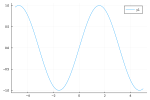

In [2]:
# Load the libraries
using Plots, GR

# Set the backend
gr()

# Make the plot
Plots.plot(sin)

#### Using `Plot()`

#### Matrices with `GR.imshow`

#### Using GR.plot functions (not `Plots.plot()`)

### Animations

In [3]:
GR.inline("webm") # https://gr-framework.org/workstations.html
# Make sure to disable this with `GR.inline("svg")`
using GR, Plots

# Values
xv = range(0, 2*π, length = 100)
σ = range(1, 2*π, length = 100)
σ = vcat(σ, reverse(σ))
extension = "gif"
filename = tempname()*"."*extension; print(filename)
    
# Interesting Logistic Function
sigmoid(x, σ) = 1/(1+exp(-(x-π)*σ))

# Use a loop to print the output
GR.beginprint(filename) # Omit to keep in memory
for s in σ
    GR.plot(xv, [sigmoid(x, s) for x in xv])
end
GR.savefig(filename)
GR.show()

/tmp/jl_FL42NR.gif

print device already activated


GR.HTML("<video autoplay controls><source type=\"video/webm\" src=\"data:video/webm;base64,GkXfo59ChoEBQveBAULygQRC84EIQoKEd2VibUKHgQJChYECGFOAZwEAAAAABR6eEU2bdLxNu4tTq4QVSalmU6yB5U27jFOrhBZUrmtTrIIBHE27jFOrhBJUw2dTrIIBVk27jVOrhBxTu2tTrIMFHnXsAQAAAAAAAJsAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABVJqWayKtexgw9CQE2AjUxhdmY1OC4yOS4xMDBXQY1MYXZmNTguMjkuMTAwRImIQMBGgAAAAAAWVK5rta4BAAAAAAAALNeBAXPFgQGcgQAitZyDdW5khoVWX1ZQOIOBAeABAAAAAAAACLCCAkm6ggG3ElTDZ/xzcwEAAAAAAAAuY8ABAAAAAAAAAGfIAQAAAAAAABpFo4dFTkNPREVSRIeNTGF2ZjU4LjI5LjEwMHNzAQAAAAAAADpjwAEAAAAAAAAEY8WBAWfIAQAAAAAAACJFo4hEVVJBVElPTkSHlDAwOjAwOjA4LjMzMzAwMDAwMAAAH0O2dSLln+eBAKNu2oEAAIBQ7QCdASpJArcBAAcIhYWIhYSIAgO03eLJR3Hun+WQeNfy0zZAf5H1NWul8nxRdwzo41fclHd6z1oC/gM+9Hn/U/sX9J1PH2v819MexvqZv4MXehfzv4uPUD+b/YB/R7pA/wH9QPYD/J/9V+4nYF/tnqA/2nqAfQB81//QfsV8DX7J/s9/0vkL/Wv///7fsAfQB9Xfqz/Y/wj/bjyy/uP4wfuj/dfQn9K/YPx9/rX+v/yf4Q/j39N5V/lP5L/Nfkd6r/qb9T/s/63f2P/Zf4T/3fnj+K/1n40/0n/gf5r3X+O38B+R3wKfj/8a/pH9c/Xn+9/9v/Ff//79/pv+f4N+if5P/Deo76R/If7t/bf8j/fv7t/3/8b9Qnv/+i/vP6le7X5N/Zv8T+SX0A/xT+T/3/+3fst/lv/T9c/83x4vrf+F/zn9x/aD6CP4p/Nf8Z/Z/8V/Vv7b/7fma/lf8X+zf+U/+3w2/Mv7d/oP8j+1v95/+X4E/xf+Sf27+1f5H/Uf3z/9/637vvX7+0vsJ/p78///ry5eRny6j5dR8uo+XUfLqPl1Hy6j5dR8uobeQ3e6bltL/oV/0K/6Ff9Cv+hX/Qr/oV/0K/uVd8x05pUgoyxcDash/Xn4zZ0g7ENIVr0ErA8XNcDe+COgEmaOvvStY5IPIvFmmq4SMwV294o37xESb8HF8xN1z0bid6h2cuXXXhMY0kxBuCdLxwbGyZq7jZ8aqHAl0eqDy/XOnipIwqF3nrdlLqib8Uc5FUyMP26wuVW81yJ/yHCky+8AA75HifP1xavS2uUBvdfZr1WKCMRw4kJ9WkJ8iNcGJRjJB/fhnoG5z+Ir4wqOkrXTE/zScDWBaYltHntTUbmk44Nr7o+OJ11rQ+Kqi7+5Bo0Q45LMdNVvpVpTBoipvPZAk9LIp1u/tiJQqTYUweC7DbB9MDLGtD4rpff1sx9DpD5si/UW7HMM642TWrrVLxV9iUXktphLTGnd/Jk04Ddbt2tfmJ+0rlL8yjdzOSHJ5sxVgjbEJ2PSEQvsztkJc/PZfJDR2w0MT8S8ra9t+f1c0h+lHwFid2/Juva0j5dR6RTXyj1tajsFMyT0BBNyOoBawvu3oEhV/a79j4WIRudDZ0h82YrvscNgfwb5+MRnyl3txzh2uxPTTUvKxQaVAunnoyaPhOit+bFMzc+Bfh3u43pWfk33R8cTvGh1n3mkquS2mJPe9Ultu0ERL+6WDtuaXJ6TfdH2Q/uQDMniGIVGendUX6yoMnjk58n21W8YgYT2cnoVJsEloxkbX83rYcLHs6F47XKBTcfYNXN5ScE6AfN2DDna6udHsqhdDkPh8sgRN+wVOZkYr/qX+tITZgnjigjEcOJCe27m3U6PR0ifrk2ZwSxO/Qr/CzPfIc441PMJEDNLslqn75DyVBGS6gSPyEQdB36AugC8HcvxxJUyZQ8QBdYruoZRfqZGIyG8hbkRX7UAthdRplZzvbSggrmlACOzTfoORQDE661ofIElbmeUsUyy/Wc/cOdLmlQdaWedDye3C5q218Psblj/6GyECv5LKGYeLoAvBTNp+xLUIy2EQ4cqV7Cv+ZvCQWARkkXHjBI34aZXNkiLR1TbQaNMSEz5wfqopK1mlYLxrQ+KqEZbJ+R9ioxGelg73ZG90tc834exGEWtkYF7PiT9BC4ct/VVBxLEn78l+7C0+c0ZfSUGj2JNODQWgsNDQq/RxmLE713BcahsGwqTTvrMgL9WK1pcPo2q2j4SE+rSnYhwG4vuwwgGY5PSR/wDv6qKLkJjK0Pe87mV1UgZpLaYOm8ITevV2eOTnjRYoTJM7HWIvym96PJvrMKN/E3paHaGdF9WkJzHdZjAauwcJ8/XpLgTqOCdAPmzFZFEzrSg+uyzVvodf9CuxuBFobArQRzfQjPgfGMISFz+yoctjQ6Q+kj/gHf1UUlawJJZS0x5M6trqPlzqcXzJR0BGhSmb+xsZ3Mdfj68HvrNMLEEZ+Q+GIBKdlN8fXgumguYtNB7xHF99XnzkhYxUTJKvJPC9E2jNAVS4P5t+mHzNWaVHHrZ4f1PEfLqPPn1NjEJ5zI9MIB7bWdOEgtW1DxFZipd6XzN51ba7ws8y2CE5MOeZDDejJkd4TUuBX/QrtAIOZF3i3n3alz6TvElE3pot8fW9g0rlAqi7+4+t7BpXKB0vv31/4pis5DRojMZScNqC3cjcQk3b0F6P/5eVcRf3dOAQCjJ5LjkvBeGn2pP71iuOQv0inyTYHHfxBKv1/GzD534mXpodPXo52N+YdYUhFWADe69dYBilCZJnY9vM78ucwbIL/K/YuPt6TJ7EUiiFyoIcDLoSo+EWWvA7X0iH2HL+yVL9SNqZazzBMiofuHOqVihDaazYrN5dXnvl5t8/uOYK8a4fSBuYc/5rDC7YcJfSBuXqF+EYuD3/sahe4UxYcnIaNE0U3Zny6jzhp56uH7zoAjMVwGknx3qVy2mJbTEtpiW0xLaYltMS2mJbTEtpiW0xLaYltMS2mJbTEtpiW0xLaYltMS2mJbTBQD+/1/LiFABAmLYwMEvIwoBaSh0C9T8EOCA5sDaJigpX3S+zCnGAl2qQEj6pJZjFAQsh4/1PanNHadTktL0AFdA/1/i1rCmg1zRDaDn4V5Fh4NjRvcmU3qUfUmyzpIma+S1t5w/LDOLFvvXrr4ytVBx4WFeRQORaBgo2SlcFYpofvGeECYJdb2QVkGdmu8+qLpzfMRiFi2eXCCXydTjPbA22ea5ozRj+kEKXzxvcnoP+YEPd+yGIgGzEp8qoNTfi8d2oYtC3p/4reH8yYJi1zsb6XYPRffALdtu/ahOct7IeX//9L93hZQGn13qbxSzqUegQt2KC3c71a3qNl8Am0uk56O8GZkqlE67Na6OZdwpcjGSJov4PYiAckzvv+GwxBeFBdSBSFVice4tbUDxPvHDgLNK57QkhGWQe81pMQtI84AYlHCzB7LApnlktcK/wl8gu6eotJpwovyggFOcr64AUFcZLYMoCdllfv/zLoXm79O1OyQuKYSuqmzVeyWb4dTwDZnyLlUgJRLZc+5FZK0h/+RcXLNiOTSuTCX9Gy1A6sDQCOD3LVAYfxWN8zg6J5BKHg+C7uVZivaKmM5LuIfke06BIRnzh9ULEVOSm+KhgjucNc71cMGTYLuIAy0kVJibDLukqpsV2

#### 3D Animation

This was inspired by [this plot](https://docs.juliaplots.org/latest/generated/gr/#gr-ref24)

Here's the default plot:

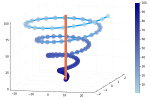

In [4]:
GR.inline("svg")
n = 100
ts = range(0, stop = 8π, length = n)
x = ts .* map(cos, ts)
y = (0.1ts) .* map(sin, ts)
z = 1:n
Plots.plot(x, y, z, zcolor = reverse(z), m = (10, 0.8, :blues, Plots.stroke(0)), leg = false, cbar = true, w = 5, camera = (20, 30))
Plots.plot!(zeros(n), zeros(n), 1:n, w = 10)

Now we can animate it: (`#TODO` this doesn't work yet)

In [5]:
using GR, Plots

GR.inline("webm") # https://gr-framework.org/workstations.html

n = 100
ts = range(0, stop = 8π, length = n)
x = ts .* map(cos, ts)
y = (0.1ts) .* map(sin, ts)
z = 1:n


extension = "gif"
filename = tempname()*"."*extension; print(filename)
    
# Use a loop to print the output
GR.beginprint(filename) # Omit to keep in memory
for a in [1:360...]
    Plots.plot(x, y, z, zcolor = reverse(z), m = (10, 0.8, :blues, Plots.stroke(0)), leg = false, cbar = true, w = 5, camera = (a, 30))
    Plots.plot!(zeros(n), zeros(n), 1:n, w = 10)
end


GR.savefig(filename)
GR.show()




/tmp/jl_w11oqN.gif

print device already activated


GR.HTML("<video autoplay controls><source type=\"video/webm\" src=\"data:video/webm;base64,GkXfo59ChoEBQveBAULygQRC84EIQoKEd2VibUKHgQJChYECGFOAZwEAAAAAADDTEU2bdLtNu4tTq4QVSalmU6yB5U27jFOrhBZUrmtTrIIBHE27jFOrhBJUw2dTrIIBVk27jFOrhBxTu2tTrIIwvewBAAAAAAAAnAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABVJqWayKtexgw9CQE2AjUxhdmY1OC4yOS4xMDBXQY1MYXZmNTguMjkuMTAwRImIAAAAAAAAAAAWVK5rta4BAAAAAAAALNeBAXPFgQGcgQAitZyDdW5khoVWX1ZQOIOBAeABAAAAAAAACLCCAkm6ggG3ElTDZ/xzcwEAAAAAAAAuY8ABAAAAAAAAAGfIAQAAAAAAABpFo4dFTkNPREVSRIeNTGF2ZjU4LjI5LjEwMHNzAQAAAAAAADpjwAEAAAAAAAAEY8WBAWfIAQAAAAAAACJFo4hEVVJBVElPTkSHlDAwOjAwOjAwLjAwMDAwMDAwMAAAH0O2dW7g54EAo27agQAAgFDtAJ0BKkkCtwEABwiFhYiFhIgCA7Td4slHce6f5ZB41/LTNkB/kfU1a6XyfFF3DOjjV9yUd3rPWgL+Az70ef9T+xf0nU8fa/zX0x7G+pm/gxd6F/O/i49QP5v9gH9HukD/Af1A9gP8n/1X7idgX+2eoD/aeoB9AHzX/9B+xXwNfsn+z3/S+Qv9a////t+wB9AH1d+rP9j/CP9uPLL+4/jB+6P919Cf0r9g/H3+tf6//J/hD+Pf03lX+U/kv81+R3qv+pv1P+z/rd/Y/9l/hP/d+eP4r/WfjT/Sf+B/mvdf47fwH5HfAp+P/xr+kf1z9ef73/2/8V///v3+m/5/g36J/k/8N6jvpH8h/u39t/yP9+/u3/f/xv1Ce//6L+8/qV7tfk39m/xP5JfQD/FP5P/f/7d+y3+W/9P1z/zfHi+t/4X/Of3H9oPoI/in81/xn9n/xX9W/tv/t+Zr+V/xf7N/5T/7fDb8y/t3+g/yP7W/3n/5fgT/F/5J/bv7V/kf9R/fP/3/rfu+9fv7S+wn+nvz//+vLl5GfLqPl1Hy6j5dR8uo+XUfLqPl1Hy6ht5Dd7puW0v+hX/Qr/oV/0K/6Ff9Cv+hX/Qr+5V3zHTmlSCjLFwNqyH9efjNnSDsQ0hWvQSsDxc1wN74I6ASZo6+9K1jkg8i8WaarhIzBXb3ijfvERJvwcXzE3XPRuJ3qHZy5ddeExjSTEG4J0vHBsbJmruNnxqocCXR6oPL9c6eKkjCoXeet2UuqJvxRzkVTIw/brC5VbzXIn/IcKTL7wADvkeJ8/XFq9La5QG919mvVYoIxHDiQn1aQnyI1wYlGMkH9+GegbnP4ivjCo6StdMT/NJwNYFpiW0ee1NRuaTjg2vuj44nXWtD4qqLv7kGjRDjksx01W+lWlMGiKm89kCT0sinW7+2IlCpNhTB4LsNsH0wMsa0Piul9/WzH0OkPmyL9RbscwzrjZNautUvFX2JReS2mEtMad38mTTgN1u3a1+Yn7SuUvzKN3M5IcnmzFWCNsQnY9IRC+zO2Qlz89l8kNHbDQxPxLytr235/VzSH6UfAWJ3b8m69rSPl1HpFNfKPW1qOwUzJPQEE3I6gFrC+7egSFX9rv2PhYhG50NnSHzZiu+xw2B/Bvn4xGfKXe3HOHa7E9NNS8rFBpUC6eejJo+E6K35sUzNz4F+He7jelZ+TfdHxxO8aHWfeaSq5LaYk971SW27QREv7pYO25pcnpN90fZD+5AMyeIYhUZ6d1RfrKgyeOTnyfbVbxiBhPZyehUmwSWjGRtfzethwsezoXjtcoFNx9g1c3lJwToB83YMOdrq50eyqF0OQ+HyyBE37BU5mRiv+pf60hNmCeOKCMRw4kJ7bubdTo9HSJ+uTZnBLE79Cv8LM98hzjjU8wkQM0uyWqfvkPJUEZLqBI/IRB0HfoC6ALwdy/HElTJlDxAF1iu6hlF+pkYjIbyFuRFftQC2F1GmVnO9tKCCuaUAI7NN+g5FAMTrrWh8gSVuZ5SxTLL9Zz9w50uaVB1pZ50PJ7cLmrbXw+xuWP/obIQK/ksoZh4ugC8FM2n7EtQjLYRDhypXsK/5m8JBYBGSRceMEjfhplc2SItHVNtBo0xITPnB+qikrWaVgvGtD4qoRlsn5H2KjEZ6WDvdkb3S1zzfh7EYRa2RgXs+JP0ELhy39VUHEsSfvyX7sLT5zRl9JQaPYk04NBaCw0NCr9HGYsTvXcFxqGwbCpNO+syAv1YrWlw+jaraPhIT6tKdiHAbi+7DCAZjk9JH/AO/qoouQmMrQ97zuZXVSBmktpg6bwhN69XZ45OeNFihMkzsdYi/Kb3o8m+swo38TelodoZ0X1aQnMd1mMBq7Bwnz9ekuBOo4J0A+bMVkUTOtKD67LNW+h1/0K7G4EWhsCtBHN9CM+B8YwhIXP7Khy2NDpD6SP+Ad/VRSVrAkllLTHkzq2uo+XOpxfMlHQEaFKZv7Gxncx1+Prwe+s0wsQRn5D4YgEp2U3x9eC6aC5i00HvEcX31efOSFjFRMkq8k8L0TaM0BVLg/m36YfM1ZpUcetnh/U8R8uo8+fU2MQnnMj0wgHttZ04SC1bUPEVmKl3pfM3nVtrvCzzLYITkw55kMN6MmR3hNS4Ff9Cu0Ag5kXeLefdqXPpO8SUTemi3x9b2DSuUCqLv7j63sGlcoHS+/fX/imKzkNGiMxlJw2oLdyNxCTdvQXo//l5VxF/d04BAKMnkuOS8F4afak/vWK45C/SKfJNgcd/EEq/X8bMPnfiZemh09ejnY35h1hSEVYAN7r11gGKUJkmdj28zvy5zBsgv8r9i4+3pMnsRSKIXKghwMuhKj4RZa8DtfSIfYcv7JUv1I2plrPMEyKh+4c6pWKENprNis3l1ee+Xm3z+45grxrh9IG5hz/msMLthwl9IG5eoX4Ri4Pf+xqF7hTFhycho0TRTdmfLqPOGnnq4fvOgCMxXAaSfHepXLaYltMS2mJbTEtpiW0xLaYltMS2mJbTEtpiW0xLaYltMS2mJbTEtpiW0xLaYltMFAP7/X8uIUAECYtjAwS8jCgFpKHQL1PwQ4IDmwNomKClfdL7MKcYCXapASPqklmMUBCyHj/U9qc0dp1OS0vQAV0D/X+LWsKaDXNENoOfhXkWHg2NG9yZTepR9SbLOkiZr5LW3nD8sM4sW+9euvjK1UHHhYV5FA5FoGCjZKVwVimh+8Z4QJgl1vZBWQZ2a7z6ounN8xGIWLZ5cIJfJ1OM9sDbZ5rmjNGP6QQpfPG9yeg/5gQ937IYiAbMSnyqg1N+Lx3ahi0Len/it4fzJgmLXOxvpdg9F98At2279qE5y3sh5f//0v3eFlAafXepvFLOpR6BC3YoLdzvVreo2XwCbS6Tno7wZmSqUTrs1ro5l3ClyMZImi/g9iIByTO+/4bDEF4UF1IFIVWJx7i1tQPE+8cOAs0rntCSEZZB7zWkxC0jzgBiUcLMHssCmeWS1wr/CXyC7p6i0mnCi/KCAU5yvrgBQVxktgygJ2WV+//Muhebv07U7JC4phK6qbNV7JZvh1PANmfIuVSAlEtlz7kVkrSH/5Fxcs2I5NK5MJf0bLUDqwNAI4PctUBh/FY3zODonkEoeD4Lu5VmK9oqYzku4h+R7ToEhGfOH1QsRU5Kb4qGCO5w1zvVwwZNgu4gDLSRUmJsMu6SqmxXau

### Create animations from scratch using imagemagick and ffmpet

I've already done this with the julia set animation from the Quant Project, I just need to copy/paste, there is possibly some packages to find `ffmpeg` and `convert` in the `PATH` but it's probably more complicated than simply using the `$shell`

## PyPlot

### Static

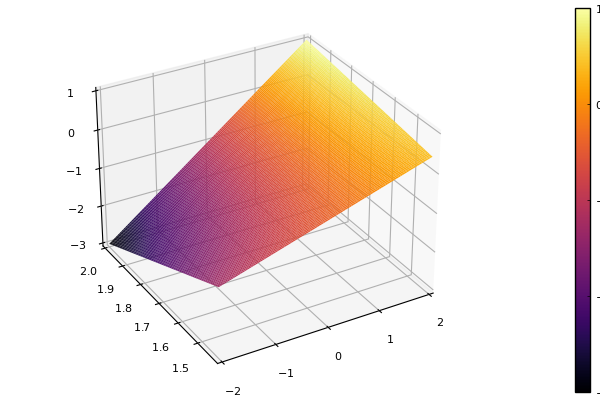

In [6]:
using Plots; pyplot()
x=range(-2,stop=2,length=100)
y=range(sqrt(2),stop=2,length=100)
f(x,y) = x*y-x-y+1
Plots.plot(x,y,f,st=:surface,camera=(-30,30))

### Interactive

## PlotlyJS

> Refer to:
>  * [IJulia Docs](https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/#IJulia)
>  * [WebIO Docs](https://juliagizmos.github.io/WebIO.jl/latest/troubleshooting/not-detected/)


```julia
using WebIO
# Notebook
WebIO.install_jupyter_nbextension()
# Jupyter lab
WebIO.install_jupyter_labextension()
```

### Using `Plots.plot`

### 3D Surface Plots

In [7]:
for x in 1:180
    Plots.plot(x,y,f,st=:surface,camera=(x,30))
end

# PlotlyJS


In [8]:
using PlotlyJS

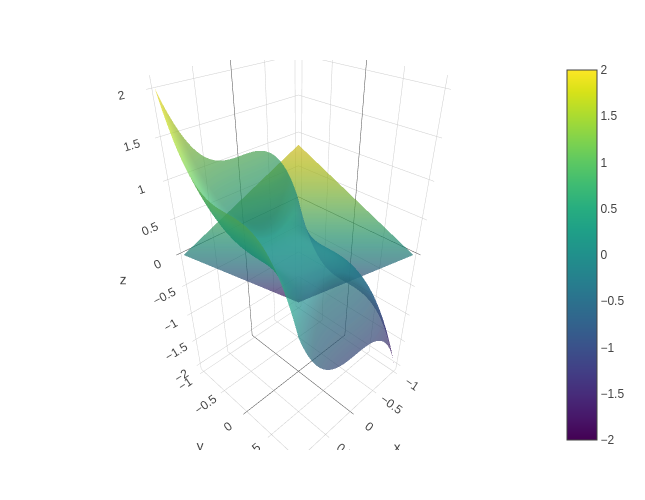

In [6]:
# Load the packages
using PlotlyJS, DataFrames, RDatasets, Colors, Distributions, LinearAlgebra

# A function to produce a plot
function plotly_planes()
    # Number of data Values
    n = 1E2

    # Domain Square
    vals = [i/n for i in -n:n]

    # Heights matrix over square
    zM = [x^3 - y^3 for x in vals, y in vals]
    zm = [x+y for x in vals, y in vals]

    # Make the Surface plot
    tracem = PlotlyJS.surface(z=zm,x=vals, y = vals, colorscale="Viridis", opacity = 0.7)
    traceM = PlotlyJS.surface(z=zM, x = vals, y = vals, showscale=false, opacity=0.7, colorscale="Viridis")

    # Actually plot them
    p = PlotlyJS.plot([tracem, traceM])
    return(p)

#    PlotlyJS.savefig(p, "/tmp/file.html")
end

# Call the function
p = plotly_planes()




    # zm = [x^2+y^2 for x in 1:n, y in 1:n]/n

#### Pure Functions

Pure Functions in Julia are done really really nicely:

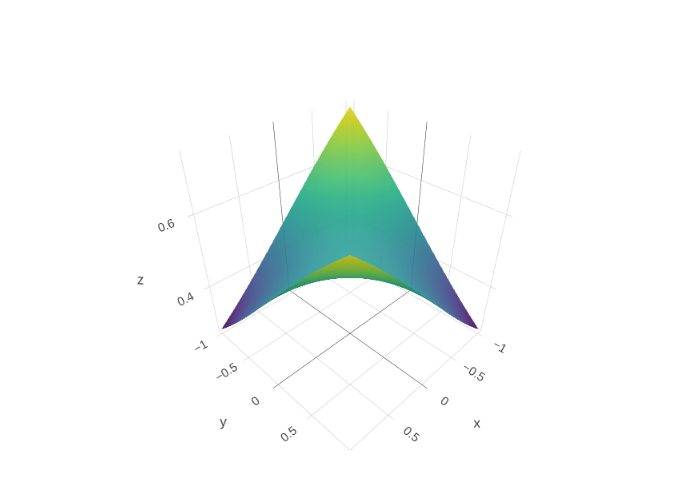

In [14]:
# Load the packages
using PlotlyJS, DataFrames, RDatasets, Colors, Distributions, LinearAlgebra

# A function to produce a plot
function plotly_planes(func)
    # Number of data Values
    n = 1E2

    # Domain Square
    vals = [i/n for i in -n:n]

    # Heights matrix over square
    zM = [func(x,y) for x in vals, y in vals]
    
    # Make the Surface plot
    traceM = PlotlyJS.surface(z=zM, x = vals, y = vals, showscale=false, opacity=0.9, colorscale="Viridis")

    # Actually plot them
    p = PlotlyJS.plot([traceM])
    return(p)

#    PlotlyJS.savefig(p, "/tmp/file.html")
end

# Call the function
p = plotly_planes((x,y) -> 1/(1+exp(-y*x)))



    # zm = [x^2+y^2 for x in 1:n, y in 1:n]/n

### Subplots with PlotlyJS

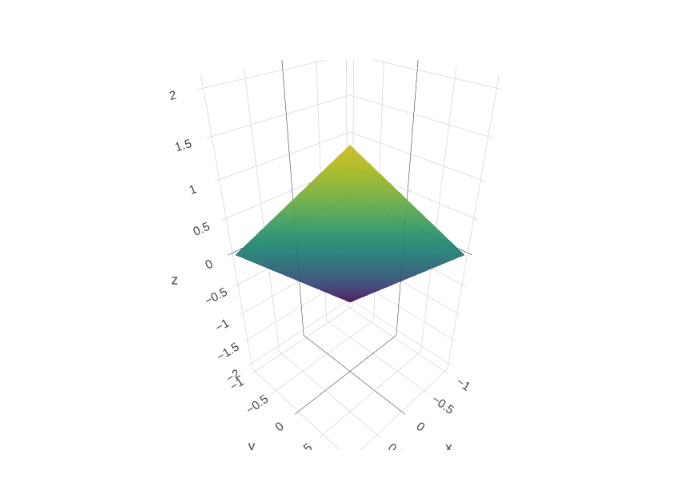

In [11]:
p1 = plotly_planes((x,y) -> x^2+y^2);
p2 = plotly_planes((x,y) -> x*y);
p3 = plotly_planes((x,y) -> 1/(1+exp(-x*y)));
p4 = plotly_planes((x,y) -> x+y); # Supress output with training `;`


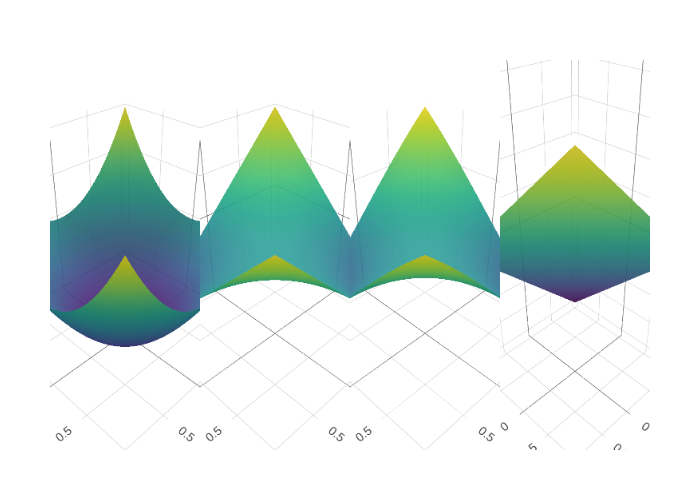

In [12]:
[ p1, p2,
  p3, p4
]

In [13]:
[1 2 ; 3 4]

2×2 Matrix{Int64}:
 1  2
 3  4